In [254]:
import cv2  
import matplotlib.pyplot as plt
import numpy as np
from skimage.io import imread, imshow 
from google.colab import files

Загружаем изображение:

In [255]:
files.upload()

Saving lena.jpg to lena (2).jpg


{'lena.jpg': b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x04\xb0\x00\x00\x04\xb0\x08\x02\x00\x00\x00dC$\x98\x00\x00\x00\x04gAMA\x00\x00\xb1\x8f\x0b\xfca\x05\x00\x00\x00 cHRM\x00\x00z&\x00\x00\x80\x84\x00\x00\xfa\x00\x00\x00\x80\xe8\x00\x00u0\x00\x00\xea`\x00\x00:\x98\x00\x00\x17p\x9c\xbaQ<\x00\x00\x00\x06bKGD\x00\xff\x00\xff\x00\xff\xa0\xbd\xa7\x93\x00\x00\x00\tpHYs\x00\x00\x0b\x12\x00\x00\x0b\x12\x01\xd2\xdd~\xfc\x00\x00\x00\x07tIME\x07\xe4\n\x0f\x0b*\x1c$\xed\x84E\x00\x00\x80\x00IDATx\xdaD\xfd\xef\x8edI\xb2\xe4\x89\x89\x88\xaa\x1d\x8f\xac\xfbg\xc8w\x19\x80C~\xe1\x0cA\x10|\x18.\xc1\xd9}\x89}\xcf\x05\x01\x82\x001\xf7vWe\x86\x9fc*\xc2\x0f\xe6\xd9\xb7\x80\xae\xae\xaa\x04"<<\x8e\x9b\xa9\x8a\x8a\xfc\x94\xff\xdb\xff\xfa\xff\xf4\x93\x8c\xa9`\x95\x01\xa4w\xbaWE\xef\xb9\xab\xf8\xc7Z+$\x9f\xef\xfc\xf5\xff\xd1\xaa\xa7\xfe\x19\xaf\xff\xdd\xfa\xf1\x03\xf7\x9f\xfc\xdb\xdf\x87\x0f\xfa\x0b\x0c\xf7\x88\x80\x88\xc2h\xd7}\xcf\xf3\xa4.\xb0^]{\xe0\xd5\xfb\xcf]=(\xccF\xfd\xc8\xf0*\xf5|;\xf7P\xbbV\x04\xef

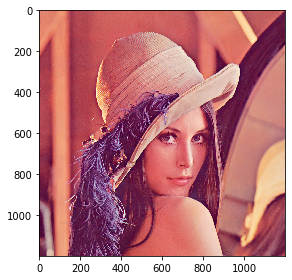

In [256]:
image = cv2.imread('lena.jpg')
imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

Детектирование. Находим лицо на изображении.
Сначала загружаем каскадный классификатор для лица.

In [7]:
files.upload()

Saving haarcascade_frontalface_alt2.xml to haarcascade_frontalface_alt2.xml


{'haarcascade_frontalface_alt2.xml': b'<?xml version="1.0"?>\n<!--\n    Tree-based 20x20 gentle adaboost frontal face detector.\n    Created by Rainer Lienhart.\n\n////////////////////////////////////////////////////////////////////////////////////////\n\n  IMPORTANT: READ BEFORE DOWNLOADING, COPYING, INSTALLING OR USING.\n\n  By downloading, copying, installing or using the software you agree to this license.\n  If you do not agree to this license, do not download, install,\n  copy or use the software.\n\n\n                        Intel License Agreement\n                For Open Source Computer Vision Library\n\n Copyright (C) 2000, Intel Corporation, all rights reserved.\n Third party copyrights are property of their respective owners.\n\n Redistribution and use in source and binary forms, with or without modification,\n are permitted provided that the following conditions are met:\n\n   * Redistribution\'s of source code must retain the above copyright notice,\n     this list of co

In [257]:
detect_img = image.copy()
gray_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2GRAY)
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_alt2.xml')
faces = face_cascade.detectMultiScale(gray_img)

#выведем количество найденных лиц на изображении
len(faces)

1

Рисуем прямоугольник вокруг лица:

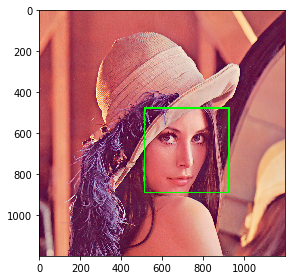

In [258]:
for (x, y, w, h) in faces:
    cv2.rectangle(detect_img, (x, y), (x+w, y+h), (0, 255, 0), 8)

imshow(cv2.cvtColor(detect_img, cv2.COLOR_RGB2BGR))

Теперь необходимо получить отдельно изображение лица. Делаем отступ 10% от границ лица и получаем этот фрагмент:


In [259]:
new_img = cv2.imread('lena.jpg')
for (x, y, w, h) in faces:
  qweW = (int)(w/10)
  qweH = (int)(h/10)

  new_img = (new_img[y-qweH: y+h+qweH, x-qweW:x+w+qweW])

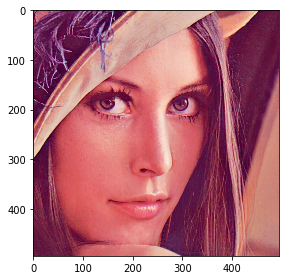

In [260]:
imshow(cv2.cvtColor(new_img, cv2.COLOR_RGB2BGR))
img = new_img.copy()

Далее получаем бинарное изображение краев. Для этого используем метод Canny, который определяет границы.

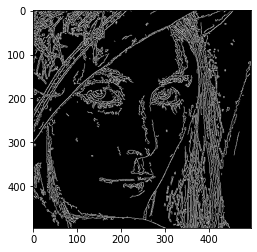

In [262]:
canny_img = img.copy()
gray = cv2.cvtColor(canny_img,cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray,55,110)
plt.imshow(edges,cmap='gray')

На полученном изображении присутствуют маленькие фрагменты, которые не относятся к границам. Их необходимо удалить. 

Ниже создадим изображение, на котором будем позже отрисовывать границы.

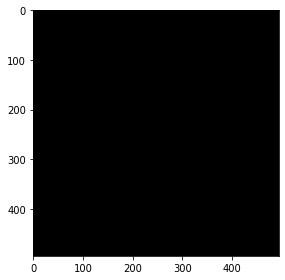

In [263]:
output_image = new_img.copy()
output_image[:] = 0
imshow(output_image)

Функция findContours извлекает контуры из двоичного изображения. После того, как мы получим контуры, удаляем те "лишние" границы, у которых длина и ширина меньше 10.


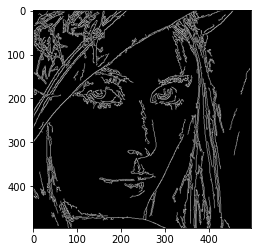

In [265]:
contours_img = edges.copy()
contours, _ = cv2.findContours(contours_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
i = 0
for c in contours:
  x,y,w,h = cv2.boundingRect(c)
  if (w > 10 and h > 10):
    cv2.drawContours(output_image, contours, i, (255,255,255), 1)
  i+=1

plt.imshow(output_image,cmap='gray')


Видим, что нам удалось избавиться от "лишник" фрагментов.

К полученному бинарному изображению применим морфоогическую операцию наращивания - Dilate. Размер труктурного элемента 5х5.


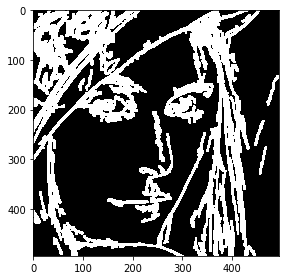

In [266]:
curr_img = cv2.cvtColor(output_image, cv2.COLOR_BGR2GRAY)
curr_img = cv2.equalizeHist(curr_img)
_, curr_img = cv2.threshold(curr_img, 0 , 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
kernel = np.ones((5,5), np.uint8)
curr_img = cv2.dilate(curr_img, kernel)
imshow(curr_img, cmap = "gray")

Сглаживаем полученное изображение: применяем фильтр Гаусса (5х5). Затем нормализуем изображение - все пикселы от 0 до 1.

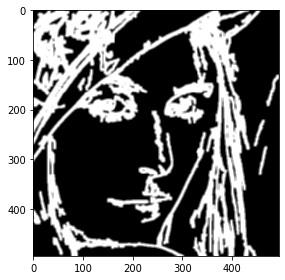

In [267]:
gauss_img = cv2.GaussianBlur(curr_img,(5,5), 7) 
normalized_img = np.zeros(gauss_img.shape, np.float32)
normalized_img = cv2.normalize(gauss_img,  normalized_img, 0, 1, cv2.NORM_MINMAX, cv2.CV_32F)
M = normalized_img.copy()
imshow(normalized_img)


Получение изображения лица с применением билатеральной фильтрацией.

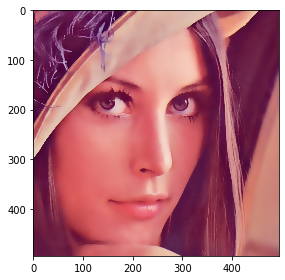

In [269]:
bil_img = img.copy()
F1 = cv2.cvtColor(bil_img, cv2.COLOR_RGB2BGR)
F1 = cv2.bilateralFilter(F1, 15, 75, 75)
imshow(F1)

Получим изображение с улучшенной четкостью:



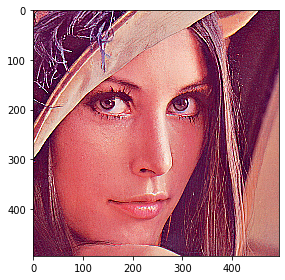

In [272]:
image_read = img.copy()
gauss_img = cv2.GaussianBlur(image_read,(5,5), 2) 
F2 = cv2.addWeighted(image_read, 3.5, gauss_img, -2.5, 0)
F2 = cv2.cvtColor(F2, cv2.COLOR_RGB2BGR)

imshow(F2)

И осуществляем финальную фильтрацию по формуле:
result[x,y,c] = m[x,y]*f2[x,y,c]+(1-m[x,y])*f1[x,y,c]

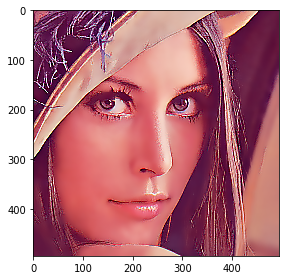

In [273]:
m = M.copy()
result = img.copy()
result[::] = 0
f1 = F1.copy()
f2 = F2.copy()

f1 = cv2.cvtColor(f1, cv2.COLOR_RGB2BGR)
f2 = cv2.cvtColor(f2, cv2.COLOR_RGB2BGR)

for x in range(m.shape[0]):
  for y in range(m.shape[1]):
    result[x,y,0] = m[x,y] * f2[x,y,0] + (1-m[x,y])*f1[x,y,0];
    result[x,y,1] = m[x,y] * f2[x,y,1] + (1-m[x,y])*f1[x,y,1];
    result[x,y,2] = m[x,y] * f2[x,y,2] + (1-m[x,y])*f1[x,y,2];

result = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)

imshow(result)